# Supernova use case notebook

ALeRCE starter notebook for supernova science.

You will need to install psycopg2, astroquery, ipyaladin

In this notebook you will connect to the ALeRCE database, download some objects with probability greater than 0.7 of being supernova, get selected light curves and plot, as well as querying NED for galaxy crossmatches.

### Load libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astropy import coordinates
from astropy.time import Time
from IPython.display import HTML
from ipywidgets import Layout, Box, widgets

Astroquery https://astroquery.readthedocs.io/en/latest/

In [3]:
#!pip install astroquery
from astroquery.ned import Ned

Install psycopg2 https://github.com/psycopg/psycopg2

In [4]:
#!pip install psycopg2-binary
import psycopg2

Install pyaladin https://github.com/cds-astro/ipyaladin

In [5]:
# you may need to restart the notebook after running the following lines
#!pip install ipyaladin
#!jupyter nbextension enable --py widgetsnbextension
#!jupyter nbextension enable --py --sys-prefix ipyaladin

In [6]:
import ipyaladin as ipyal  # see installation instructions here: https://github.com/cds-astro/ipyaladin

### Get credentials (not in github repository)

In [7]:
import json

credentials_file = "alercereaduser_v2.json"
with open(credentials_file) as jsonfile:
    params = json.load(jsonfile)["params"]

### Connect to DB

In [8]:
conn = psycopg2.connect(
    dbname=params["dbname"],
    user=params["user"],
    host=params["host"],
    password=params["password"],
)

### Show all the available tables

In [9]:
query = "select tablename from pg_tables where schemaname='public';"
tables = pd.read_sql_query(query, conn)
tables.sort_values(by="tablename")

,tablename
9,asassn
18,class
10,crtsnorth
12,crtssouth
4,detections
23,early_classification_v2
16,features
22,features_v2
2,features_v3
24,ingestion_timestamp


### For each table, show column names and column types

In [10]:
alltabs = []
for tab in sorted(tables.tablename):
    cols = pd.DataFrame()
    query = (
        "select column_name, data_type from information_schema.columns where table_name = '%s';"
        % tab
    )
    results = pd.read_sql_query(query, conn)
    results["table"] = tab
    alltabs.append(results)
dftab = pd.concat(alltabs)
pd.options.display.max_rows = 999
display(dftab[["table", "column_name", "data_type"]])
pd.options.display.max_rows = 101

,table,column_name,data_type
0,asassn,ASAS-SN Name,text
1,asassn,Other Names,text
2,asassn,LCID,integer
3,asassn,ra,double precision
4,asassn,dec,double precision
5,asassn,Mean VMag,double precision
6,asassn,Amplitude,double precision
7,asassn,Period,double precision
8,asassn,Type,text
9,asassn,Url,text


### Query class numbers

In [11]:
query = "select * from class"
classes = pd.read_sql_query(query, conn)
classmapper = dict(zip(classes.name.tolist(), classes.id.tolist()))
classmapper_invert = dict(zip(classes.id.tolist(), classes.name.tolist()))
classmapper

{'Other': 0,
 'Ceph': 1,
 'LPV': 4,
 'RRL': 5,
 'EB': 3,
 'SNe': 6,
 'DSCT': 2,
 'Blazar': 8,
 'CV/Nova': 9,
 'SLSN': 14,
 'AGN': 18,
 'SN': 19,
 'Variable Star': 20,
 'Asteroid': 21,
 'Bogus': 22,
 'SNIa': 10,
 'SNIbc': 11,
 'SNII': 12,
 'SNIIn': 13,
 'EBSD/D': 15,
 'EBC': 16,
 'Periodic-Other': 17,
 'AGN-I': 7,
 'RS-CVn': 23,
 'QSO-I': 24}

# get the times of the oldest detection in the database

In [12]:
query = """
select min(mjd)
from detections
"""

df = pd.read_sql_query(query, conn)
print(df.iloc[0])

min    58270.167662
Name: 0, dtype: float64


In [20]:
from astropy.time import Time

t = Time(df.iloc[0].values[0], format="mjd", scale="utc")
print(t.isot)

2018-06-01T04:01:25.997


# get the total number of detections, non_detections, objects and classified objects

In [21]:
query = """
select count(oid)
from objects
"""

df = pd.read_sql_query(query, conn)
print("Number of objects", df.iloc[0])

query = """
select count(candid)
from detections
"""

df = pd.read_sql_query(query, conn)
print("Number of detections", df.iloc[0])

query = """
select count(mjd)
from non_detections
"""

df = pd.read_sql_query(query, conn)
print("Number of non-detections", df.iloc[0])

Number of objects count    33802127
Name: 0, dtype: int64
Number of detections count    86440360
Name: 0, dtype: int64
Number of non-detections count    981709386
Name: 0, dtype: int64


# Get the total number of classified Bogus objects in the database

In [311]:
query = """
select classearly, pclassearly
from objects
where objects.nobs>1
"""  #% classmapper["Variable Star"]

df = pd.read_sql_query(query, conn)
print("Number of classified Bogus objects", df.iloc[0])

KeyboardInterrupt: 

In [309]:
df.classearly.unique()

array([20., 21., 18., 22., 19., nan])

18.0
19.0
20.0
21.0
22.0
nan
Here


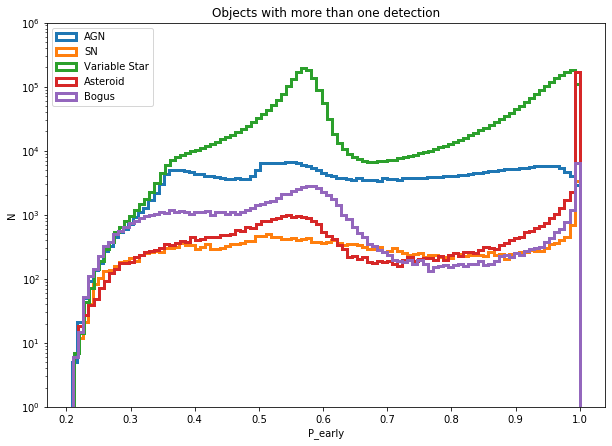

In [310]:
fig, ax = plt.subplots(figsize=(10, 10 / np.sqrt(2)))
for cl in np.sort(df.classearly.unique()):
    print(cl)
    if np.isnan(cl):
        print("Here")
        continue
    mask = df.classearly == cl
    ax.hist(
        df.loc[mask].pclassearly,
        label=classmapper_invert[cl],
        bins=100,
        log=True,
        lw=3,
        histtype="step",
    )
plt.legend(loc=2)
ax.set_ylim(1, 1e6)
ax.set_xlabel("P_early")
ax.set_ylabel("N")
ax.set_title("Objects with more than one detection")
plt.savefig("early.png")

# Get the spatial distribution of objects classified by the early classifier

In [344]:
query = """
select classearly, pclassearly, meanra, meandec, nobs
from objects
"""  #% classmapper["Variable Star"]

df = pd.read_sql_query(query, conn)

In [316]:
df.shape

(34043614, 4)

### Get ecliptic and galactic coordinates

In [323]:
#!pip install pyephem
import ephem

In [324]:
ecl = df.apply(
    lambda row: ephem.Ecliptic(
        ephem.Equatorial(
            "%s" % (row.meanra / 15.0), "%s" % row.meandec, epoch=ephem.J2000
        )
    ),
    axis=1,
)

In [346]:
df["ecl_lat"] = ecl.apply(lambda row: np.rad2deg(row.lat))
df["ecl_long"] = ecl.apply(lambda row: np.rad2deg(row.long))

In [326]:
gal = df.apply(
    lambda row: ephem.Galactic(
        ephem.Equatorial(
            "%s" % (row.meanra / 15.0), "%s" % row.meandec, epoch=ephem.J2000
        )
    ),
    axis=1,
)

In [347]:
df["gal_lat"] = gal.apply(lambda row: np.rad2deg(row.lat))
df["gal_long"] = gal.apply(lambda row: np.rad2deg(row.long))

### Save for future usage

In [450]:
df.to_pickle("all_early_coords.pkl")

### Load from pickle

In [11]:
df = pd.read_pickle("all_early_coords.pkl")

### Plot latitude distributions

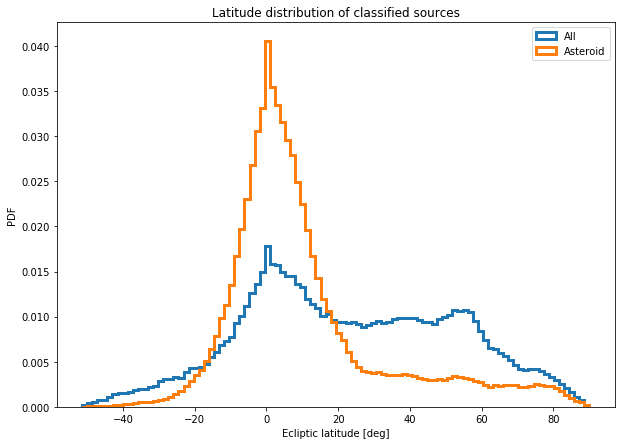

In [12]:
fig, ax = plt.subplots(figsize=(10, 10 / np.sqrt(2)))
# All
ax.hist(df.ecl_lat, label="All", bins=100, density=True, lw=3, histtype="step")
mask = (df.classearly == classmapper["Asteroid"]) & (df.pclassearly > 0.6)
ax.hist(
    df.loc[mask].ecl_lat,
    label="Asteroid",
    bins=100,
    density=True,
    lw=3,
    histtype="step",
)


plt.legend()
ax.set_xlabel("Ecliptic latitude [deg]")
ax.set_ylabel("PDF")
ax.set_title("Latitude distribution of classified sources")
plt.savefig("ecl_latitudes.png")

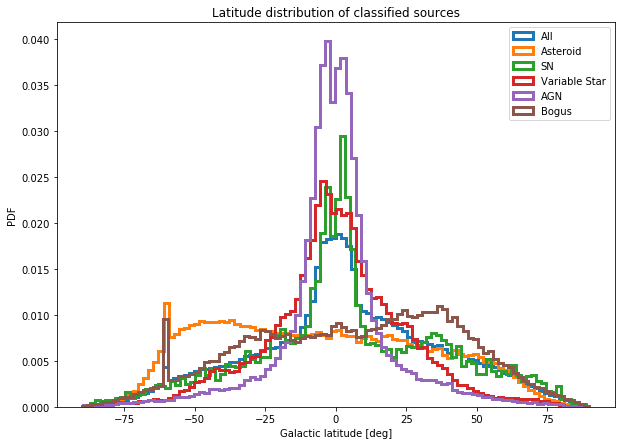

In [13]:
fig, ax = plt.subplots(figsize=(10, 10 / np.sqrt(2)))
# All
ax.hist(df.gal_lat, label="All", bins=100, density=True, lw=3, histtype="step")
#
# mask = df.classearly == classmapper["Asteroid"]
# ax.hist(df.loc[mask].ecl_lat, label = "Asteroid", bins=100, density=True, lw=3, histtype="step")
# The rest
for cl in ["Asteroid", "SN", "Variable Star", "AGN", "Bogus"]:
    if cl in ["SN", "Variable Star", "AGN"]:
        mask = (
            (df.classearly == classmapper[cl]) & (df.pclassearly > 0.6) & (df.nobs > 1)
        )
    else:
        mask = (df.classearly == classmapper[cl]) & (df.pclassearly > 0.6)
    ax.hist(
        df.loc[mask].gal_lat, label=cl, bins=100, density=True, lw=3, histtype="step"
    )


plt.legend()
ax.set_xlabel("Galactic latitude [deg]")
ax.set_ylabel("PDF")
ax.set_title("Latitude distribution of classified sources")
plt.savefig("latitudes.png")

# Plot 2D spatial distributions

In [14]:
import datashader as ds
import datashader.transfer_functions as tf
import bokeh.plotting as bp
from datashader.bokeh_ext import InteractiveImage
from matplotlib.cm import viridis

1.11.3


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
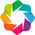

In [15]:
import datashader as ds
import holoviews as hv

print(hv.__version__)
from holoviews import opts
from holoviews.operation.datashader import (
    datashade,
    shade,
    spread,
    dynspread,
    rasterize,
)
import holoviews.plotting.bokeh

hv.extension("bokeh", "matplotlib")

### Asteroids

In [16]:
dims = ["ecl_long", "ecl_lat"]
mask = df.classearly == classmapper["Asteroid"]
figure = dynspread(datashade(hv.Points(df.loc[mask][dims].values), cmap=viridis))
figure.opts(
    title="Asteroid spatial distribution",
    xlabel="Ecliptic Longitude [deg]",
    ylabel="Ecliptic Latitude [deg]",
).opts(opts.RGB(width=900, height=636))

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [17]:
hv.save(figure, "asteroids.png", fmt="png")

In [18]:
dims = ["gal_long", "gal_lat"]
mask = df.classearly == classmapper["SN"]
figure = dynspread(datashade(hv.Points(df.loc[mask][dims].values), cmap=viridis))
figure.opts(
    title="Supernova spatial distribution",
    xlabel="Galactic Longitude [deg]",
    ylabel="Galactic Latitude [deg]",
).opts(opts.RGB(width=900, height=636))

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [19]:
hv.save(figure, "supernova.png", fmt="png")

# AGN

In [20]:
dims = ["gal_long", "gal_lat"]
mask = df.classearly == classmapper["AGN"]
figure = dynspread(datashade(hv.Points(df.loc[mask][dims].values), cmap=viridis))
figure.opts(
    title="AGN spatial distribution",
    xlabel="Galactic Longitude [deg]",
    ylabel="Galactic Latitude [deg]",
).opts(opts.RGB(width=900, height=636))

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [21]:
hv.save(figure, "agn.png", fmt="png")

# Variable stars

In [22]:
dims = ["gal_long", "gal_lat"]
mask = df.classearly == classmapper["Variable Star"]
figure = dynspread(datashade(hv.Points(df.loc[mask][dims].values), cmap=viridis))
figure.opts(
    title="Variable Stars spatial distribution",
    xlabel="Galactic Longitude [deg]",
    ylabel="Galactic Latitude [deg]",
).opts(opts.RGB(width=900, height=636))

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [23]:
hv.save(figure, "VS.png", fmt="png")

# Bogus

In [24]:
dims = ["gal_long", "gal_lat"]
mask = df.classearly == classmapper["Bogus"]
figure = dynspread(datashade(hv.Points(df.loc[mask][dims].values), cmap=viridis))
figure.opts(
    title="Bogus spatial distribution",
    xlabel="Galactic Longitude [deg]",
    ylabel="Galactic Latitude [deg]",
).opts(opts.RGB(width=900, height=636))

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [25]:
hv.save(figure, "Bogus.png", fmt="png")

In [449]:
dims = ["ecl_long", "ecl_lat"]
mask_ast = df.classearly == classmapper["Asteroid"]
plots = {"Asteroid": hv.Points(df.loc[mask_ast][dims].values, dims)}

dims = ["gal_long", "gal_lat"]
plots = {
    "SN": hv.Points(df.loc[df.classearly == classmapper["SN"]][dims].values, dims),
    "AGN": hv.Points(df.loc[df.classearly == classmapper["AGN"]][dims].values, dims),
    "Variable Star": hv.Points(
        df.loc[df.classearly == classmapper["Variable Star"]][dims].values, dims
    ),
    "Bogus": hv.Points(
        df.loc[df.classearly == classmapper["Bogus"]][dims].values, dims
    ),
}

from datashader.colors import Sets1to3  # default datashade() and shade() color cycle

color_key = list(Sets1to3[0 : len(plots)])
color_points = hv.NdOverlay(
    {
        k: hv.Points([0, 0], label=str(k)).opts(color=v)
        for k, v in zip(plots.keys(), color_key)
    }
)

gaussspread = spread(
    datashade(hv.NdOverlay(plots, kdims="k"), aggregator=ds.count_cat("k"))
)

(color_points * gaussspread).opts(opts.RGB(width=900, height=630))

:DynamicMap   []
   :Overlay
      .NdOverlay.AGN :NdOverlay   [Element]
         :Points   [x,y]
      .RGB.I         :RGB   [gal_long,gal_lat]   (R,G,B,A)

In [399]:
bp.output_notebook()
p = bp.figure(
    tools="pan,wheel_zoom,reset",
    x_range=(0, 360),
    y_range=(-60, 90),
    plot_width=800,
    plot_height=500,
)


def image_callback(x_range, y_range, w, h):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(
        df.loc[(df.classearly == classmapper["Asteroid"])],
        "ecl_long",
        "ecl_lat",
        ds.count(),
    )
    img = tf.shade(agg, cmap=viridis)
    return tf.spread(img)


InteractiveImage(p, image_callback)

Loading BokehJS ...

/home/fforster/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


# Get the total number of classified objects in the database

In [22]:
query = """
select count(classrf)
from objects
"""

df = pd.read_sql_query(query, conn)
print("Number of classified objects", df.iloc[0])

Number of classified objects count    774352
Name: 0, dtype: int64


In [23]:
query = """
select count(classearly)
from objects
"""

df = pd.read_sql_query(query, conn)
print("Number of classified objects", df.iloc[0])

Number of classified objects count    15331953
Name: 0, dtype: int64


# Get the total number of classified objects per class

In [37]:
for key in sorted(classmapper.keys()):
    query = (
        """
    select count(classrf)
    from objects
    where classrf=%i
    """
        % classmapper[key]
    )

    df = pd.read_sql_query(query, conn)
    print("Number of %s classified objects: %i" % (key, df.iloc[0].values[0]))

Number of AGN classified objects: 0
Number of AGN-I classified objects: 16243
Number of Asteroid classified objects: 0
Number of Blazar classified objects: 20043
Number of Bogus classified objects: 0
Number of CV/Nova classified objects: 9665
Number of Ceph classified objects: 12645
Number of DSCT classified objects: 21382
Number of EB classified objects: 0
Number of EBC classified objects: 29829
Number of EBSD/D classified objects: 136736
Number of LPV classified objects: 186019
Number of Other classified objects: 0
Number of Periodic-Other classified objects: 70668
Number of QSO-I classified objects: 79602
Number of RRL classified objects: 48921
Number of RS-CVn classified objects: 135945
Number of SLSN classified objects: 892
Number of SN classified objects: 0
Number of SNII classified objects: 1238
Number of SNIIn classified objects: 0
Number of SNIa classified objects: 3244
Number of SNIbc classified objects: 1280
Number of SNe classified objects: 0
Number of Variable Star classif

# Read data from google analytics

/home/fforster/Documents/whitepaper/google_analytics/explorer_sesiones.csv
7777.77
/home/fforster/Documents/whitepaper/google_analytics/snhunter_sesiones.csv
2238.236


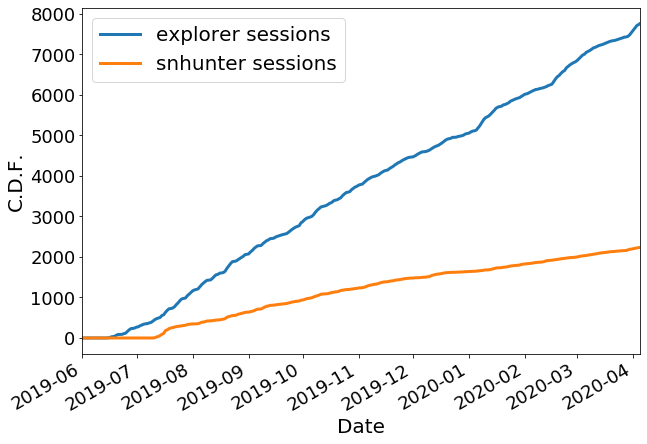

In [128]:
google_analytics_dir = "/home/fforster/Documents/whitepaper/google_analytics"
fig, ax = plt.subplots(figsize=(10, 10 / np.sqrt(2.0)))
for interface in ["explorer", "snhunter"]:
    for what in ["sesiones"]:  # "usuarios"
        filename = "%s/%s_%s.csv" % (google_analytics_dir, interface, what)
        print(filename)
        df = pd.read_csv(filename, comment="#")
        df.rename(
            {"Índice de día": "day", "Sesiones": "Sessions", "Usuarios": "Users"},
            axis=1,
            inplace=True,
        )
        df["Date"] = pd.to_datetime(df.day, dayfirst=True)  # format="%d/%m/%y")
        print(df.Sessions.sum())
        df["cum"] = df.Sessions.cumsum()
        df.plot.line(
            x="Date", y="cum", label="%s sessions" % interface, ax=ax, fontsize=18, lw=3
        )
        ax.legend(fontsize=20)
        ax.set_xlabel("Date", fontsize=20)
        ax.set_ylabel("C.D.F.", fontsize=20)
plt.savefig("Sessions.pdf")

/home/fforster/Documents/whitepaper/google_analytics/explorer_usuarios.csv
/home/fforster/Documents/whitepaper/google_analytics/snhunter_usuarios.csv


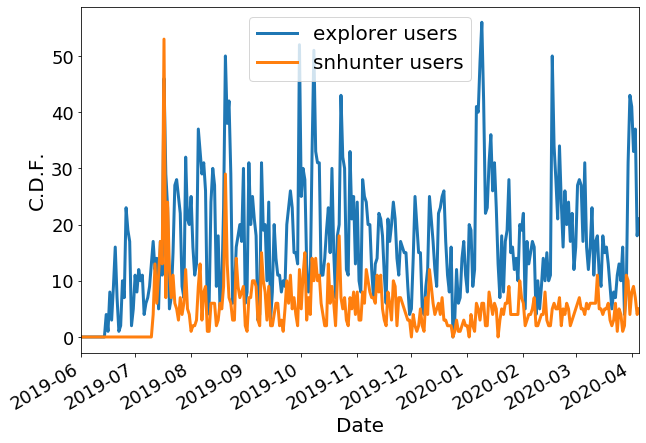

In [141]:
google_analytics_dir = "/home/fforster/Documents/whitepaper/google_analytics"
fig, ax = plt.subplots(figsize=(10, 10 / np.sqrt(2.0)))
for interface in ["explorer", "snhunter"]:
    for what in ["usuarios"]:  # "usuarios"
        filename = "%s/%s_%s.csv" % (google_analytics_dir, interface, what)
        print(filename)
        df = pd.read_csv(filename, comment="#")
        df.rename(
            {"Índice de día": "day", "Sesiones": "Sessions", "Usuarios": "Users"},
            axis=1,
            inplace=True,
        )
        df["Date"] = pd.to_datetime(df.day, dayfirst=True)  # format="%d/%m/%y")
        df["cum"] = df.Users
        df.plot.line(
            x="Date", y="cum", label="%s users" % interface, ax=ax, fontsize=18, lw=3
        )
        ax.legend(fontsize=20)
        ax.set_xlabel("Date", fontsize=20)
        ax.set_ylabel("C.D.F.", fontsize=20)
plt.savefig("Sessions.pdf")

In [129]:
7777.77 + 2238.236

10016.006000000001

/home/fforster/Documents/whitepaper/google_analytics/explorer_paises.csv
2208.206


,País,Usuarios,Usuarios nuevos,Sesiones,Porcentaje de rebote,Páginas/sesión,Duración media de la sesión,Tasa de conversión del objetivo,Objetivos cumplidos,Valor del objetivo,FracUser
0,Chile,660.000,646.000,3.735,"54,83 %","3,51",00:07:24,"0,00 %",0,"0,00 US$",0.298885
1,United States,607.000,585.000,1.731,"61,64 %","4,00",00:03:50,"0,00 %",0,"0,00 US$",0.274884
2,Japan,180.000,173.000,423.000,"75,41 %","1,54",00:01:57,"0,00 %",0,"0,00 US$",0.081514
3,China,151.000,149.000,173.000,"90,17 %","1,20",00:01:03,"0,00 %",0,"0,00 US$",0.068381
4,United Kingdom,114.000,108.000,263.000,"74,90 %","1,85",00:01:11,"0,00 %",0,"0,00 US$",0.051626
5,Spain,103.000,97.000,431.000,"57,54 %","2,95",00:05:30,"0,00 %",0,"0,00 US$",0.046644
6,Italy,56.000,55.000,95.000,"77,89 %","1,44",00:02:00,"0,00 %",0,"0,00 US$",0.025360
7,Germany,35.000,29.000,353.000,"63,17 %","1,97",00:03:52,"0,00 %",0,"0,00 US$",0.015850
8,Canada,30.000,30.000,40.000,"85,00 %","1,50",00:01:19,"0,00 %",0,"0,00 US$",0.013586
9,Israel,23.000,21.000,36.000,"72,22 %","1,44",00:02:00,"0,00 %",0,"0,00 US$",0.010416


/home/fforster/Documents/whitepaper/google_analytics/snhunter_paises.csv
1294


,País,Usuarios,Usuarios nuevos,Sesiones,Porcentaje de rebote,Páginas/sesión,Duración media de la sesión,Tasa de conversión del objetivo,Objetivos cumplidos,Valor del objetivo,FracUser
0,Chile,267,264,1.418,"72,00 %","2,44",00:05:03,"0,00 %",0,"0,00 US$",0.206337
1,United States,143,136,324.000,"79,63 %","1,28",00:01:48,"0,00 %",0,"0,00 US$",0.110510
2,Spain,45,44,191.000,"64,92 %","1,85",00:04:42,"0,00 %",0,"0,00 US$",0.034776
3,United Kingdom,31,28,50.000,"86,00 %","1,14",00:00:17,"0,00 %",0,"0,00 US$",0.023957
4,Italy,18,17,23.000,"82,61 %","1,17",00:00:17,"0,00 %",0,"0,00 US$",0.013910
5,Sweden,18,18,35.000,"80,00 %","1,37",00:01:39,"0,00 %",0,"0,00 US$",0.013910
6,Canada,16,16,18.000,"83,33 %","1,28",00:00:32,"0,00 %",0,"0,00 US$",0.012365
7,Japan,14,10,17.000,"88,24 %","1,12",00:01:33,"0,00 %",0,"0,00 US$",0.010819
8,China,13,12,15.000,"73,33 %","1,27",00:01:16,"0,00 %",0,"0,00 US$",0.010046
9,Ecuador,11,11,21.000,"100,00 %","1,00",00:00:00,"0,00 %",0,"0,00 US$",0.008501


(55,)

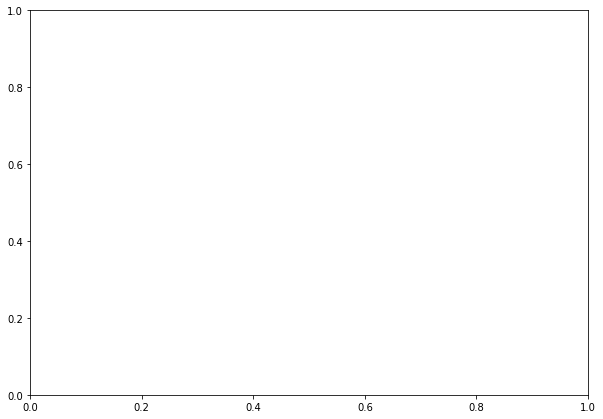

In [134]:
google_analytics_dir = "/home/fforster/Documents/whitepaper/google_analytics"
fig, ax = plt.subplots(figsize=(10, 10 / np.sqrt(2.0)))
df_all = []
for interface in ["explorer", "snhunter"]:
    filename = "%s/%s_paises.csv" % (google_analytics_dir, interface)
    print(filename)
    df = pd.read_csv(filename, comment="#")
    total_users = df.Usuarios.sum()
    print(total_users)
    df["FracUser"] = df.Usuarios / total_users
    df_all.append(df)
    display(df)
    # df.rename({"Índice de día": "day", "Sesiones": "Sessions", "Usuarios": "Users"}, axis = 1, inplace=True)
    # df["Date"] = pd.to_datetime(df.day,dayfirst=True)# format="%d/%m/%y")
    # df["cum"] = df.Sessions.cumsum()
    # df.plot.line(x="Date", y="cum", label="%s sessions" % interface, ax=ax, fontsize=18, lw=3)
    # ax.legend(fontsize=20)
    # ax.set_xlabel("Date", fontsize=20)
    # ax.set_ylabel("C.D.F.", fontsize=20)
# plt.sav#efig("Sessions.pdf")
df_all = pd.concat(df_all)
df_all["País"].unique().shape

In [130]:
2208.206 + 1294

3502.206

# Connect to reporter

In [142]:
import json

credentials_file = "../reporter_user.json"
with open(credentials_file) as jsonfile:
    params = json.load(jsonfile)["params"]

In [143]:
conn = psycopg2.connect(
    dbname=params["dbname"],
    user=params["user"],
    host=params["host"],
    password=params["password"],
)

In [144]:
query = "select tablename from pg_tables where schemaname='public';"
tables = pd.read_sql_query(query, conn)
tables.sort_values(by="tablename")

,tablename
3,auth_group
4,auth_group_permissions
2,auth_permission
7,auth_user
6,auth_user_groups
10,auth_user_user_permissions
12,authtoken_token
15,challenger_challenge
16,challenger_submission
17,challenger_usertakeschallenge


In [145]:
alltabs = []
for tab in sorted(tables.tablename):
    cols = pd.DataFrame()
    query = (
        "select column_name, data_type from information_schema.columns where table_name = '%s';"
        % tab
    )
    results = pd.read_sql_query(query, conn)
    results["table"] = tab
    alltabs.append(results)
dftab = pd.concat(alltabs)
pd.options.display.max_rows = 999
display(dftab[["table", "column_name", "data_type"]])
pd.options.display.max_rows = 101

,table,column_name,data_type
0,auth_group,id,integer
1,auth_group,name,character varying
0,auth_group_permissions,id,integer
1,auth_group_permissions,group_id,integer
2,auth_group_permissions,permission_id,integer
0,auth_permission,id,integer
1,auth_permission,name,character varying
2,auth_permission,content_type_id,integer
3,auth_permission,codename,character varying
0,auth_user,id,integer


In [174]:
query = """
select count(report_type)
from reporter_report
where report_type='Bogus'
"""

df = pd.read_sql_query(query, conn)
df

,count
0,9424


In [203]:
query = """
select object, date, report_type
from reporter_report
where report_type='Bogus'
"""

df = pd.read_sql_query(query, conn)
df.head()

,object,date,report_type
0,ZTF20aafluly,2020-01-15 21:28:47.152435+00:00,Bogus
1,ZTF20aafvqcq,2020-01-16 14:02:09.545421+00:00,Bogus
2,ZTF20aagsswk,2020-01-19 17:43:04.647667+00:00,Bogus
3,ZTF20aagseyk,2020-01-19 18:01:49.102657+00:00,Bogus
4,ZTF20aahirqy,2020-01-24 14:04:30.076413+00:00,Bogus


In [204]:
df["day"] = df.apply(
    lambda row: "%s/%s/%s" % (row.date.year, row.date.month, row.date.day), axis=1
)

In [205]:
df.object.shape

(9424,)

In [206]:
df.date.min()

Timestamp('2019-09-13 11:10:43+0000', tz='UTC')

In [207]:
df.day.unique().shape

(144,)

In [208]:
144 / 6 * 8

192.0

TypeError: data type not understood

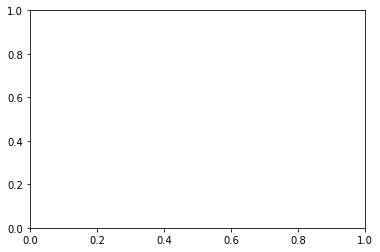

In [214]:
fig, ax = plt.subplots()
df.plot.scatter(x="date", y="date")

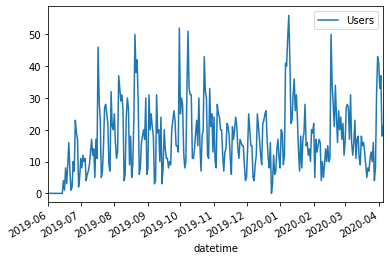

In [91]:
df.plot.line(x="datetime", y="Users")

### Query SN Ia which exploded at least 70 days after ZTF's 1st light, with p > 0.2 and crossmatch with a known SNe

In [11]:
mjd_1stlight = Time("2017-11-01T00:00:00", format="isot", scale="utc").mjd - 70

query = """
select late_probabilities_v2.oid, objects.meanra, 
objects.meandec, objects.nobs, objects.mean_magpsf_g, objects.mean_magpsf_r,
objects.min_magpsf_g, objects.min_magpsf_r, objects.classxmatch, objects.firstMJD

from late_probabilities_v2 

inner join objects
on late_probabilities_v2.oid=objects.oid

where late_probabilities_v2."SNIa_prob">0.2 and objects.classxmatch=%s
and objects.firstMJD > %s
""" % (
    classmapper["SNe"],
    mjd_1stlight,
)
# notar que "SNIa_prob" is written between parenthesis, since this is a programatically defined column in SQL

SNe = pd.read_sql_query(query, conn)
SNe.set_index("oid", inplace=True)
SNe.head()

,meanra,meandec,nobs,mean_magpsf_g,mean_magpsf_r,min_magpsf_g,min_magpsf_r,classxmatch,firstmjd
oid,,,,,,,,,
ZTF18abdcfgz,191.625816,77.280998,6,NaN,18.813313,NaN,18.229561,6,58295.279537
ZTF18aceynvm,153.875648,37.983334,18,18.675600,18.636825,17.999588,17.971712,6,58432.492893
ZTF18aazblzy,242.839486,36.994293,36,18.936053,19.301688,18.257574,18.432648,6,58281.215000
ZTF18aaxcntm,247.046387,39.820116,33,18.664966,18.284261,16.801624,16.830229,6,58272.259375
ZTF18aaxavsk,264.583441,67.849464,20,18.688750,19.109741,18.396341,18.560711,6,58272.390382


In [12]:
SNe.shape

(233, 9)

### Create function to plot SN light curve

In [13]:
def plotLC(oid, SN_det, SN_nondet):
    fig, ax = plt.subplots(figsize=(14, 7))
    labels = {1: "g", 2: "r"}
    colors = {1: "g", 2: "r"}
    for fid in [1, 2]:
        mask = SN_det.fid == fid
        if np.sum(mask) > 0:
            ax.errorbar(
                SN_det[mask].mjd,
                SN_det[mask].magpsf_corr,
                yerr=SN_det[mask].sigmapsf_corr,
                c=colors[fid],
                marker="o",
                label=labels[fid],
            )
        mask = (SN_nondet.fid == fid) & (SN_nondet.diffmaglim > -900)
        if np.sum(mask) > 0:
            ax.scatter(
                SN_nondet[mask].mjd,
                SN_nondet[mask].diffmaglim,
                c=colors[fid],
                alpha=0.5,
                marker="v",
                label="lim.mag. %s" % labels[fid],
            )
    ax.set_title(oid)
    ax.set_xlabel("MJD")
    ax.set_ylabel("Magnitude")
    ax.legend()
    ax.set_ylim(ax.get_ylim()[::-1])

### Create function to show stamp

In [14]:
def plotstamp(oid, candid):
    science = (
        "http://avro.alerce.online/get_stamp?oid=%s&candid=%s&type=science&format=png"
        % (oid, candid)
    )
    images = """
    &emsp;&emsp;&emsp;&emsp;&emsp;
    Science
    &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; 
    Template
    &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; 
    Difference
    <div class="container">
    <div style="float:left;width:20%%"><img src="%s"></div>
    <div style="float:left;width:20%%"><img src="%s"></div>
    <div style="float:left;width:20%%"><img src="%s"></div>
    </div>
    """ % (
        science,
        science.replace("science", "template"),
        science.replace("science", "difference"),
    )
    display(HTML(images))

### Create function to get data and plot SN light curve

In [15]:
def getSNdata(oid, doLC=False, dostamp=False, doNED=False):

    results = {}

    # query detections and sort by mjd
    query = (
        "select oid, candid, ra, dec, fid, mjd, magpsf_corr, sigmapsf_corr from detections where oid='%s'"
        % oid
    )
    SN_det = pd.read_sql_query(query, conn)
    SN_det.sort_values(by=["mjd"], inplace=True)
    results["LC_det"] = SN_det

    # query non detections and sort by mjd
    query = "select oid, fid, mjd, diffmaglim from non_detections where oid='%s'" % oid
    SN_nondet = pd.read_sql_query(query, conn)
    SN_nondet.sort_values(by=["mjd"], inplace=True)
    results["LC_nondet"] = SN_nondet

    if doLC:
        plotLC(oid, SN_det, SN_nondet)

    # find NED galaxies
    if doNED:
        co = coordinates.SkyCoord(
            ra=SNe.meanra[oid], dec=SNe.meandec[oid], unit=(u.deg, u.deg), frame="fk5"
        )
        Ned_table = Ned.query_region(co, radius=0.01 * u.deg, equinox="J2000.0")
        display(Ned_table)
        results["Ned_table"] = Ned_table

    if dostamp:
        plotstamp(oid, SN_det.candid.min())

    # return data
    return results

### Get the brightest SN

In [16]:
seloid = SNe.min_magpsf_g.idxmin()
print(seloid)

ZTF18acqqyah


### Do one SN with NED and Aladin

No.,Object Name,RA,DEC,Type,Velocity,Redshift,Redshift Flag,Magnitude and Filter,Separation,References,Notes,Photometry Points,Positions,Redshift Points,Diameter Points,Associations
,,degrees,degrees,,km / s,,,,arcmin,,,,,,,
int32,bytes30,float64,float64,object,float64,float64,object,object,float64,int32,int32,int32,int32,int32,int32,int32
1,SDSS J112717.58+593800.2,171.82328,59.63339,G,--,--,,20.1g,0.501,0,0,15,1,0,4,0
2,SDSS J112718.53+593735.0,171.82724,59.62641,*,709009.0,2.365,PHOT,19.8g,0.405,2,0,5,1,1,4,0
3,SDSS J112719.03+593740.7,171.82932,59.62798,G,5179.0,0.017275,,20.6g,0.304,3,0,15,1,0,4,0
4,UGC 06452,171.83,59.62666,G,5112.0,0.017051,,14.0g,0.328,43,3,60,13,8,15,0
5,2MASS J11271939+5937430,171.8305,59.62861,PofG,5177.0,0.017269,,16.5g,0.257,1,0,25,3,3,4,0
6,SDSS J112719.38+593723.4,171.83079,59.62319,*,--,--,,21.9g,0.474,0,0,5,1,0,4,0
7,GALEXASC J112719.53+593739.0,171.8314,59.62751,UvS,--,--,,,0.263,0,0,4,1,0,0,0
8,SDSS J112719.59+593727.3,171.83165,59.62427,*,313283.0,1.045,PHOT,21.4g,0.405,3,0,5,1,1,4,0


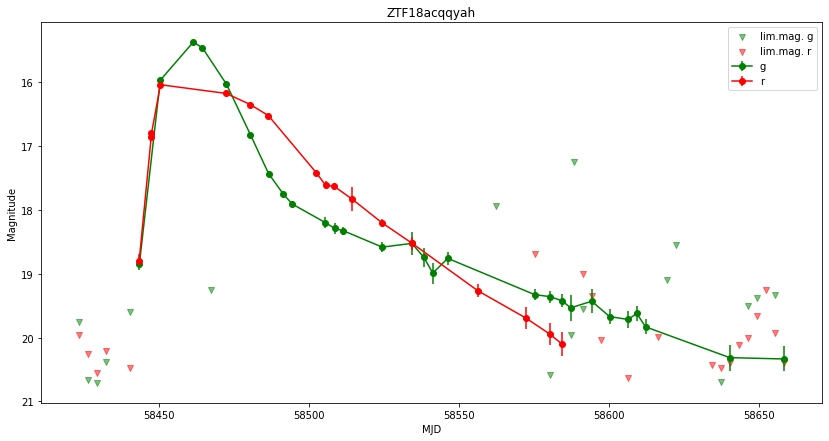

In [17]:
# seloid = np.random.choice(SNe.index)
# print(seloid)
results = getSNdata(seloid, doLC=True, dostamp=True, doNED=True)
LC_det = results["LC_det"]
LC_nondet = results["LC_nondet"]
Ned_table = results["Ned_table"]

In [18]:
LC_det.shape, LC_nondet.shape

((45, 8), (37, 4))

In [19]:
info = widgets.HTML()


def process_objectHovered(data):

    output = '<font color="red">'
    # NED
    if "Object Name" in data["data"].keys():
        output = "<h2>NED</h2>"
        output += "<p>Object Name: %s</p>" % data["data"]["Object Name"]
        sel_keys = ["Type", "Redshift", "Redshift_flag"]
    for key in sel_keys:
        if key in data["data"].keys():
            output += "<p>%s: %s</p>" % (key, data["data"][key])
    info.value = "%s" % output

In [20]:
aladin = ipyal.Aladin(
    target="%s %s" % (SNe.meanra[seloid], SNe.meandec[seloid]),
    fov=0.04,
    survey="P/PanSTARRS/DR1/color-z-zg-g",
    reticle_size=64,
    layout=Layout(width="70%"),
)
box_layout = Layout(
    display="flex", flex_flow="row", align_items="stretch", width="100%"
)
box = Box(children=[aladin, info], layout=box_layout)
display(box)
aladin.add_table(Ned_table)
aladin.add_listener("objectHovered", process_objectHovered)

Box(children=(Aladin(fov=0.04, layout=Layout(width='70%'), options=['allow_full_zoomout', 'coo_frame', 'fov', …